In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import os
import sys

# Read Data from 3D SLAHMR output, 4D human with pose + camera information

In [3]:
observed_file = 'content/slahmr/outputs/logs/video-val/2024-03-08/shorto-all-shot-0-0-180/motion_chunks/shorto_000000_world_results.npz'
observed_data = np.load(observed_file)

smoothed_file = 'content/slahmr/outputs/logs/video-val/2024-03-08/shorto-all-shot-0-0-180/smooth_fit/shorto_000000_world_results.npz'
smoothed_data = np.load(smoothed_file)

In [4]:
print(smoothed_data.files)

""" observed_data.files: 
['latent_pose', 'root_orient', 'world_scale', 'betas', 'trans', 'pose_body', 'cam_R', 'cam_t', 'intrins']

cam_R: (3, 3) rotation matrix - constant bc camera is fixed
cam_t: (3,) translation vector (x, y, z) - constant bc camera is fixed
pose_body: (N, T, 63 = 21 * 3) 3D joint positions in world coordinates ~ body_pose : B x T x J*3
latent_pose: B x T x D, where D is the dimension of the latent space, note that it is a latent space, not a 3D space
world scale: (1, 1) - constant bc camera is fixed
betas: (#Detected Humans, 16) In the code snippet, BETA_SIZE = 16 indicates that the model uses 16 shape coefficients to define the body shape.
trans: (N, T, 3) translation vector (x, y, z) - constant bc camera is fixed
root_orient: (N, T, 3) root orientation in world coordinates 
intrinsics: (4,) camera intrinsics (f_x, f_y, c_x, c_y) - constant bc camera is fixed

 """


['latent_pose', 'root_orient', 'world_scale', 'betas', 'trans', 'pose_body', 'cam_R', 'cam_t', 'intrins']


" observed_data.files: \n['latent_pose', 'root_orient', 'world_scale', 'betas', 'trans', 'pose_body', 'cam_R', 'cam_t', 'intrins']\n\ncam_R: (3, 3) rotation matrix - constant bc camera is fixed\ncam_t: (3,) translation vector (x, y, z) - constant bc camera is fixed\npose_body: (N, T, 63 = 21 * 3) 3D joint positions in world coordinates ~ body_pose : B x T x J*3\nlatent_pose: B x T x D, where D is the dimension of the latent space, note that it is a latent space, not a 3D space\nworld scale: (1, 1) - constant bc camera is fixed\nbetas: (#Detected Humans, 16) In the code snippet, BETA_SIZE = 16 indicates that the model uses 16 shape coefficients to define the body shape.\ntrans: (N, T, 3) translation vector (x, y, z) - constant bc camera is fixed\nroot_orient: (N, T, 3) root orientation in world coordinates \nintrinsics: (4,) camera intrinsics (f_x, f_y, c_x, c_y) - constant bc camera is fixed\n\n "

/var/folders/hw/3660m8hd1kn0dr01m6nf8vsh0000gn/T/ipykernel_22263/879715106.py:39: MatplotlibDeprecationWarning:

Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later



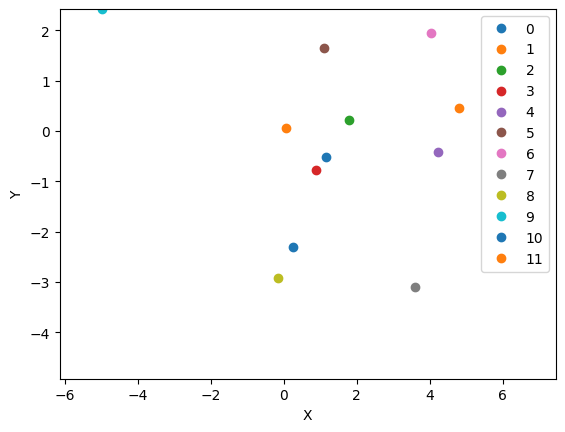

In [134]:
transformations = smoothed_data['trans']
root_orient = smoothed_data['root_orient']

# Plot the Translations for the first 100 frames for all the people N represents a person trans = (N, T, 3)
# T is the number of frames

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Assuming 'transformations' is your numpy array with shape (N, T, 3)
T = transformations.shape[1]
N = transformations.shape[0]

# Setup the figure and axis for animation
fig, ax = plt.subplots()
ax.set_xlim((np.min(transformations[:,:,0]), np.max(transformations[:,:,0])))
ax.set_ylim((np.min(transformations[:,:,1]), np.max(transformations[:,:,1])))

# Prepare lines for each person; assuming 'N' is the number of people
lines = [ax.plot([], [], marker='o', linestyle='')[0] for _ in range(N)]
# add a legend of 0 to N-1
ax.legend([str(i) for i in range(N)])

# add axis labels
ax.set_xlabel('X')
ax.set_ylabel('Y')

# Initialization function: plot the background of each frame
def init():
    for line in lines:
        line.set_data([], [])
    return lines

# Animation update function: this is called sequentially
def update(frame):
    for i, line in enumerate(lines):
        x, y = transformations[i, frame, 0], transformations[i, frame, 1]
        line.set_data(x, y)
    return lines

# Create animation using FuncAnimation
ani = FuncAnimation(fig, update, frames=T, init_func=init, blit=True)
ani.save('translations_animation.gif', writer='pillow', fps=20)
plt.show()

# To save the animation, you can use:
# ani.save('translations_animation.mp4', writer='ffmpeg')


In [38]:
import numpy as np

def getOccupancy(trans, heading, pedestrians_trans):
    # FOV Definitions
    paraFOV = {'angle_range': 8, 'resolution': 1.0}  # Half angle for easier calculations
    biFOV = {'angle_range': 60, 'resolution': 0.85}
    perFOV = {'angle_range': 120, 'resolution': 0.7}
    max_distance = 2  # Maximum distance to consider

    # Convert inputs to numpy arrays
    c_pose = np.array(trans[:2])
    pedestrians_pose = np.array(pedestrians_trans[:, :2])  # Ensure it's an array for operations
    pedestrian_vector = c_pose - pedestrians_pose
    heading_rad = -(np.pi - np.arctan2(heading[1], heading[0]))

    # Heading vector
    heading_vector = np.array([np.cos(heading_rad), np.sin(heading_rad)])
    norms = np.linalg.norm(pedestrian_vector, axis=1)
    unitVectors = pedestrian_vector / norms[:, np.newaxis]
    
    angles_rad = np.arccos(np.clip(np.dot(unitVectors, heading_vector), -1, 1))
    angles_deg = np.abs(np.rad2deg(angles_rad))  # Convert angle to degrees

    # Initialize O_n with zeros
    O_n = np.zeros((len(pedestrians_pose), 3))
    
    for i, angl in enumerate(angles_deg):

        if  paraFOV['angle_range'] < angl and angl <= paraFOV['angle_range']:
            resolution = paraFOV['resolution']
        elif perFOV['angle_range'] < angl and angl <= biFOV['angle_range']:
            resolution = biFOV['resolution']
        elif biFOV['angle_range'] < angl and angl <= perFOV['angle_range']:
            resolution = perFOV['resolution']
        else:
            resolution = 0  # Keep as zero if not in FOV

        # Update O_n with [x, y, resolution]
        # print(i)
        # print(O_n.shape)
        O_n[i] = np.array([pedestrians_pose[i, 0], pedestrians_pose[i, 1], resolution])

    # print the angles of the last frame
    # print(angles_deg)

    return O_n

def getOccupancyFrames(trans, heading):
    N, T, _ = trans.shape
    # Initialize the occupancy array with zeros for each pedestrian, for each time step
    O_r = np.zeros((N, T, N-1, 3))

    for n in range(N):
        for t in range(T):
            cur_trans = trans[n, t]
            cur_heading = heading[n, t]
            pedestrian_trans = np.delete(trans, n, axis=0)[:, t, :]  # Exclude current pedestrian
            O_n = getOccupancy(cur_trans, cur_heading, pedestrian_trans)
            # Insert O_n into O_r, adjusting for the exclusion of the current pedestrian
            O_r[n, t, :, :] = O_n

    return O_r


# Get Occupancy given the translations and heading
occupancy = (getOccupancyFrames(transformations, root_orient))
occupancy.shape

/var/folders/hw/3660m8hd1kn0dr01m6nf8vsh0000gn/T/ipykernel_22263/1561473466.py:19: RuntimeWarning: invalid value encountered in divide
  unitVectors = pedestrian_vector / norms[:, np.newaxis]


(12, 148, 11, 3)

In [168]:
"""
We are creating a simple Diffusion model for Trajectory Generation
A Trajectory we hope to predict X_t+1 given X_t, S_t, and O_t

O_t is the occupancy of other agents
S_t is the Semantic Class of the Object
X_t is the current position of the object

The Diffusion Models Goal is to Predict:

p(X_{n-1} |X_{n}, S_n, O_{n})


Data for the model is given in the following format 

N is the number of agents
T is the number of time steps

X = (N, T, 4) ~ (x, y, theta, phi)
S = (N, T, 1) ~ Semantic Class
O = (N, T, N-1, 3) 3 is the x, y, confidence of the other agents

O Must Be Placed into a latent space that can encode a given step

trans: (N, T, 3) translation vector (x, y, z) - constant bc camera is fixed
root_orient: (N, T, 3) root orientation in world coordinates 
"""

# Place Occupancy, X, and S, into a data structure that can be used for training

# X = (N, T, 4) ~ (x, y, theta, phi)
# S = (N, T, 1) ~ Semantic Class
# O = (N, T, N-1, 3) 3 is the x, y, confidence of the other agents

import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence


def createData(transformations, root_orient):
    occupancy  = getOccupancyFrames(transformations, root_orient)
    N, T, _ = transformations.shape

    X = np.zeros((N, T, 4))
    S = np.zeros((N, T, 1))
    O = np.zeros((N, T, N-1, 3))

    for n in range(N):
        for t in range(T):
            X[n, t, 0] = transformations[n, t, 0]
            X[n, t, 1] = transformations[n, t, 1]
            X[n, t, 2] = root_orient[n, t, 0]
            X[n, t, 3] = root_orient[n, t, 1]
            S[n, t, 0] = 0
            if n == 9:
                S[n, t, 0] = 1
            O[n, t, :, :] = occupancy[n, t, :, :]

    return X, S, O


class TrajectoryHistoryDataset(Dataset):
    def __init__(self, X, S, O, max_history_len=11):
        self.max_history_len = max_history_len
        N, T, _ = X.shape

        # Preparing the inputs (X_history) and outputs (Y_next)
        # X_history will be a list of tensors, each tensor representing the history of positions up to time t
        self.X_history = []
        self.S_t = []  # Semantic class at time t
        self.O_t = []  # Occupancy at time t
        self.Y_next = []  # Position at time t+1

        # Iterate over each agent and time step, collecting the necessary data
        for n in range(N):
            for t in range(1, T):  # Start from 1 since we need at least one previous step
                history_len = min(t, max_history_len)
                prev_positions = X[n, t-history_len:t, :].reshape(-1, 4)
                self.X_history.append(prev_positions)
                
                self.S_t.append(S[n, t, :])
                self.O_t.append(O[n, t, :].reshape(-1, 3))  # Adjust O_t shape if needed
                
                if t < T-1:  # Ensure there is a next step to predict
                    self.Y_next.append(X[n, t+1, :])
        
        # Convert lists to tensors for PyTorch compatibility
        self.X_history = [torch.tensor(pos, dtype=torch.float) for pos in self.X_history]
        self.S_t = torch.tensor(self.S_t, dtype=torch.float)
        self.O_t = [torch.tensor(occ, dtype=torch.float) for occ in self.O_t]
        self.Y_next = torch.tensor(self.Y_next, dtype=torch.float)

    def __len__(self):
        return len(self.Y_next)

    def __getitem__(self, idx):
        # For sequences, directly return the tensors without converting, as they are already tensors
        return self.X_history[idx], self.S_t[idx], self.O_t[idx], self.Y_next[idx]

# Assuming your createData function returns correctly shaped X, S, O
X, S, O = createData(transformations, root_orient)

# Create the Dataset with historical data
dataset = TrajectoryHistoryDataset(X, S, O)

# Create the DataLoader
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)  # Batch size of 1 due to variable sequence lengths


import torch
import torch.nn as nn
import torch.nn.functional as F

class OccupancyEncoder(nn.Module):
    def __init__(self):
        super(OccupancyEncoder, self).__init__()
        
        # Calculate the flattened input size (1*11*3 = 33)
        self.input_size = 1 * 11 * 3
        
        # Define the MLP layers
        self.fc1 = nn.Linear(self.input_size, 64)  # First fully connected layer
        self.fc2 = nn.Linear(64, 32)               # Second fully connected layer
        self.fc3 = nn.Linear(32, 2)                # Output layer to get output shape (1, 2)
        
    def forward(self, x):
        # Flatten the input
        x = x.view(-1, self.input_size)  # Reshape input to (batch_size, 1*11*3)
        
        # MLP with ReLU activations
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        
        # Output layer (no activation here as this is your encoded representation)
        x = self.fc3(x)
        return x

    

class TrajectoryAndOccupancyEncoder(nn.Module):
    def __init__(self, occupancy_embed_size, num_random_predictions=5):
        super().__init__()
        self.channel_in = 4  # This needs to be dynamically adjusted if your X_t does not initially match
        self.channel_out = 32
        self.dim_kernel = 3
        self.dim_embedding_key = 256
        self.num_random_predictions = num_random_predictions
        
        # Spatial convolution operates on the X input
        self.spatial_conv = nn.Conv1d(self.channel_in, self.channel_out, self.dim_kernel, stride=1, padding=1)
        
        # Adjusting the input size for GRU to include occupancy embedding Packed Sequence is shape 11 x 6
        self.temporal_encoder = nn.GRU(6, self.dim_embedding_key, batch_first=True, bidirectional=True, num_layers=2)
        
        # This linear layer maps the GRU output state to k random predictions
        self.prediction_head = nn.Linear(512, num_random_predictions * 2)  # Assuming each prediction is 2D (x, y)
        
        self.relu = nn.ReLU()
        
        self.reset_parameters()

    def reset_parameters(self):
        nn.init.kaiming_normal_(self.spatial_conv.weight)
        nn.init.zeros_(self.spatial_conv.bias)
        # Reset parameters for GRU and prediction head if necessary
        for name, param in self.temporal_encoder.named_parameters():
            if 'weight_ih' in name:
                nn.init.kaiming_normal_(param)
            elif 'weight_hh' in name:
                nn.init.kaiming_normal_(param)
            elif 'bias' in name:
                nn.init.zeros_(param)
        nn.init.kaiming_normal_(self.prediction_head.weight)
        nn.init.zeros_(self.prediction_head.bias)

    def forward(self, X, encoded_O, X_lengths):
        # Ensuring X has the correct number of channels
        #print("X shape ", X.shape)
        if X.size(1) != self.channel_in:
            # Adjust the input X to have the correct channel_in size, e.g., through zero-padding
            pad_size = self.channel_in - X.size(1)
            X_padded = F.pad(X, (0, 0, 0, pad_size), "constant", 0)
            X_t = torch.transpose(X_padded, 1, 2)  # Adjusting dimensions for Conv1d
        else:
            X_t = torch.transpose(X, 1, 2)

        # Spatial convolution
        X_after_spatial = self.relu(self.spatial_conv(X_t))
        
        # Preparing encoded occupancy to concatenate
        encoded_O_expanded = encoded_O.unsqueeze(1).expand(-1, X_after_spatial.size(1), -1)

       # print(X_after_spatial.shape)
       # print(encoded_O_expanded.shape)
        
        # Concatenating along the feature dimension (last dimension)
        X_combined = torch.cat((X_after_spatial, encoded_O_expanded), dim=2)

        
                # Handling variable lengths
        packed_X = pack_padded_sequence(X_combined, X_lengths, batch_first=True, enforce_sorted=False)

        #print("Packed X", packed_X.data.shape)


        packed_output, _ = self.temporal_encoder(packed_X)

        #print("trmpotl encoder", packed_output)
        output_x, _ = pad_packed_sequence(packed_output, batch_first=True)

        #print("get preds", output_x.shape) # get preds torch.Size([1, 11, 512])

        
        # Predictions
        predictions = self.prediction_head(output_x)


        
        
        return predictions



class TrajectoryAndOccupancyEncoderTrainingLoop:
    def __init__(self, model, occupancy_encoder, optimizer, loss_fn, device):
        self.model = model
        self.optimizer = optimizer
        self.loss_fn = loss_fn
        self.device = device
        self.o_encoder = occupancy_encoder
        

    def train(self, dataloader, num_epochs):
        self.model.train()
        self.model.to(self.device)

        for epoch in range(num_epochs):
            for batch in dataloader:
                X, S, O, Y = [b.to(self.device) for b in batch]

                # Assuming X is a tensor of shape (batch, T, 4)
                # Assuming S is a tensor of shape (batch, T, 1)
                # Assuming O is a list of tensors, each tensor of shape (batch, N-1, 3)
                # Assuming Y is a tensor of shape (batch, 4)

                # Assuming X_lengths is a tensor of shape (batch,) containing the original lengths of X sequences
                X_lengths = torch.sum(torch.sum(X, dim=-1) != 0, dim=-1)

                # Encode O
                encoded_O = []
                for o in O:
                    encoded_O.append(self.o_encoder(o))
                # Inside your training loop
                encoded_O = torch.mean(torch.stack(encoded_O, dim=1), dim=1)  # Example of averaging embeddings if applicable


                #print("X shape ", X.shape)
                #print("Encoded O shape ", encoded_O.shape)
                #print("O Shape ", O.shape)


                predictions = self.model(X, encoded_O, X_lengths)

                # Calculate loss
                loss = self.loss_fn(predictions, Y)

                # Backpropagation
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()

                print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')




# Assuming the model and optimizer are initialized
traj_init = TrajectoryAndOccupancyEncoder(6, 2)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(traj_init.parameters(), lr=0.001)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize the occupancy encoder
occupancy_encoder = OccupancyEncoder()

# Initialize the training loop
training_loop = TrajectoryAndOccupancyEncoderTrainingLoop(traj_init, occupancy_encoder, optimizer, loss_fn, device)

# Train the model
training_loop.train(dataloader, num_epochs=10)





/var/folders/hw/3660m8hd1kn0dr01m6nf8vsh0000gn/T/ipykernel_22263/1561473466.py:19: RuntimeWarning:

invalid value encountered in divide



Epoch [1/10], Loss: 5.2572
Epoch [1/10], Loss: 6.5174
Epoch [1/10], Loss: 4.0962
Epoch [1/10], Loss: 21.0176
Epoch [1/10], Loss: 34.2062
Epoch [1/10], Loss: 22.9232
Epoch [1/10], Loss: 6.7622
Epoch [1/10], Loss: 13.4299
Epoch [1/10], Loss: 0.6407
Epoch [1/10], Loss: 2.5590
Epoch [1/10], Loss: 2.6776
Epoch [1/10], Loss: 8.0802
Epoch [1/10], Loss: 10.7516
Epoch [1/10], Loss: 1.0322
Epoch [1/10], Loss: 10.4140
Epoch [1/10], Loss: 6.2371
Epoch [1/10], Loss: 1.1486
Epoch [1/10], Loss: 2.3621
Epoch [1/10], Loss: 9.2974
Epoch [1/10], Loss: 1.1667
Epoch [1/10], Loss: 2.0904
Epoch [1/10], Loss: 3.2997
Epoch [1/10], Loss: 16.5221
Epoch [1/10], Loss: 2.4508
Epoch [1/10], Loss: 1.4879
Epoch [1/10], Loss: 6.4186
Epoch [1/10], Loss: 5.5040
Epoch [1/10], Loss: 9.0411
Epoch [1/10], Loss: 3.4619
Epoch [1/10], Loss: 0.9662
Epoch [1/10], Loss: 2.3452
Epoch [1/10], Loss: 4.8650
Epoch [1/10], Loss: 4.9911
Epoch [1/10], Loss: 1.5587
Epoch [1/10], Loss: 9.2828
Epoch [1/10], Loss: 3.8820
Epoch [1/10], Loss: 1

In [197]:
# Save the trained model
torch.save(traj_init.state_dict(), 'trajectory_model.pt')

# Load the trained model
traj_init.load_state_dict(torch.load('trajectory_model.pt'))


# Test the model by ploting the predictions vs the actual values, for different agents N
traj_init.eval()

with torch.no_grad():
    for batch in dataloader:
        X, S, O, Y = [b.to(device) for b in batch]
        X_lengths = torch.sum(torch.sum(X, dim=-1) != 0, dim=-1)
        encoded_O = []
        for o in O:
            encoded_O.append(occupancy_encoder(o))
        encoded_O = torch.mean(torch.stack(encoded_O, dim=1), dim=1)
        predictions = traj_init(X, encoded_O, X_lengths)
        print(X)
        print(predictions)
        print(Y)
        break  # Only test one batch for now



tensor([[[ 4.3412e+00, -1.1632e+00,  3.2044e+00, -3.0494e-02],
         [ 4.3139e+00, -1.1381e+00,  3.1996e+00, -6.2130e-03],
         [ 4.2907e+00, -1.1121e+00,  3.1909e+00,  3.0693e-02],
         [ 4.2691e+00, -1.0980e+00,  3.1802e+00,  1.4094e-02],
         [ 4.2456e+00, -1.0770e+00,  3.1596e+00,  2.0992e-02],
         [ 4.2227e+00, -1.0667e+00,  3.1472e+00,  2.9500e-02],
         [ 4.2026e+00, -1.0553e+00,  3.1382e+00,  3.0146e-02],
         [ 4.1830e+00, -1.0293e+00,  3.1244e+00,  2.0511e-02],
         [ 4.1598e+00, -9.8524e-01,  3.1045e+00,  1.3823e-03],
         [ 4.1377e+00, -9.4709e-01,  3.1107e+00, -1.3135e-02],
         [ 4.1109e+00, -9.0446e-01,  3.1041e+00, -4.0126e-02]]])
tensor([[[ 3.2743, -0.5736,  2.9255, -0.0039],
         [ 3.1611, -0.6519,  3.1985,  0.1089],
         [ 3.1702, -0.7268,  3.0322,  0.1054],
         [ 3.3204, -0.5825,  3.1571,  0.1247],
         [ 3.4555, -0.5693,  3.2262,  0.1053],
         [ 3.1024, -1.1604,  2.4548,  0.1127],
         [ 3.1412, -1.1

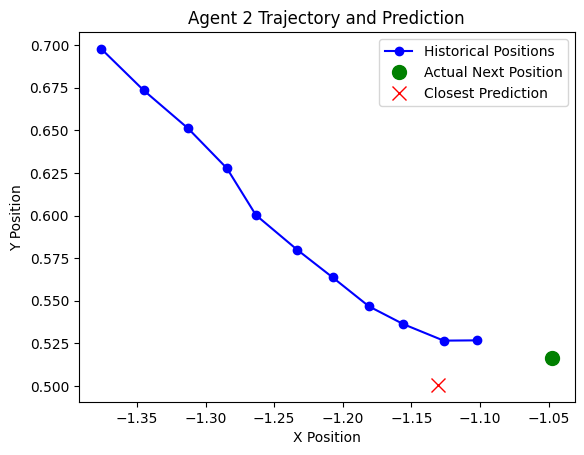

In [230]:
import numpy as np
import matplotlib.pyplot as plt

def plot_trajectory_and_prediction(X, Y, predictions, agent_index):
    # X: Historical positions
    # Y: Actual next positions
    # predictions: Predicted next positions
    # agent_index: Index of the agent to plot

    # Plot historical positions
    plt.plot(X[:, 0], X[:, 1], 'bo-', label='Historical Positions')
    # Plot actual next position
    plt.plot(Y[0], Y[1], 'go', markersize=10, label='Actual Next Position')

    # Plot all predictions (optional, can be commented out to reduce clutter)
    # for pred in predictions:
    #     plt.plot(pred[0], pred[1], 'rx')

    # Calculate distances to actual next position and find the closest prediction
    distances = np.linalg.norm(predictions - Y.numpy()[:2], axis=1)
    closest_pred_index = np.argmin(distances)
    closest_pred = predictions[closest_pred_index]

    # Plot closest prediction
    plt.plot(closest_pred[0], closest_pred[1], 'rx', markersize=10, label='Closest Prediction')

    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.legend()
    plt.title(f'Agent {agent_index} Trajectory and Prediction')
    plt.show()

# Prepare for testing
traj_init.eval()  # Set the model to evaluation mode
with torch.no_grad():
    for batch_idx, batch in enumerate(dataloader):
        X, S, O, Y = [b.to(device) for b in batch]
        X_lengths = torch.sum(torch.sum(X, dim=-1) != 0, dim=-1)
        encoded_O = []
        for o in O:
            encoded_O.append(occupancy_encoder(o))
        encoded_O = torch.mean(torch.stack(encoded_O, dim=1), dim=1)
        predictions = traj_init(X, encoded_O, X_lengths)
        
        
        if batch_idx == 110:  # Only test one batch for now
            for agent_index in range(X.size(0)):
                X_agent = X[agent_index]
                Y_agent = Y[agent_index]
                predictions_agent = predictions[agent_index].cpu().numpy().reshape(-1, 2)
                plot_trajectory_and_prediction(X_agent, Y_agent, predictions_agent, batch_idx % 12)
            break

        


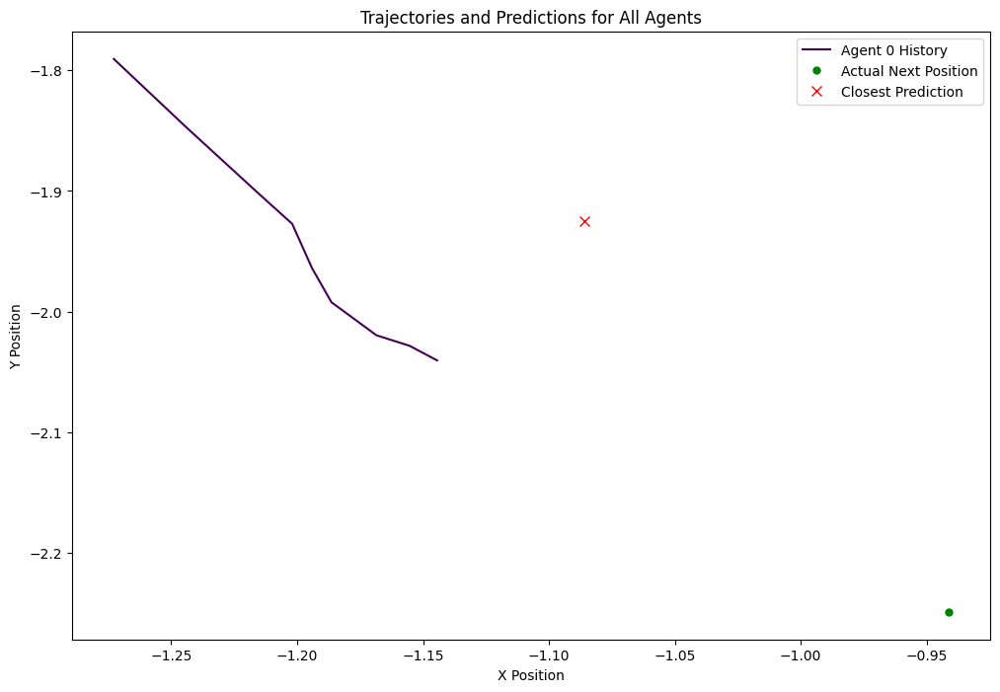

In [222]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def plot_trajectory_and_prediction(X, Y, predictions, agent_index, ax, num_agents):
    """
    Adds the trajectory and prediction for a single agent to the plot.

    Args:
    - X: Historical positions for the agent.
    - Y: Actual next position for the agent.
    - predictions: Predicted next positions for the agent.
    - agent_index: Index of the agent (used for color selection).
    - ax: The matplotlib axis to plot on.
    - num_agents: Total number of agents in the batch.
    """
    # Define a color palette
    colors = plt.cm.viridis(np.linspace(0, 1, num_agents))
    
    # Plot historical positions
    ax.plot(X[:, 0], X[:, 1], '-', color=colors[agent_index], label=f'Agent {agent_index} History' if agent_index == 0 else "")
    # Plot actual next position
    ax.plot(Y[0], Y[1], 'o', color='green', markersize=5, label='Actual Next Position' if agent_index == 0 else "")
    
    # Calculate distances to actual next position and find the closest prediction
    distances = np.linalg.norm(predictions - Y[:2], axis=1)
    closest_pred_index = np.argmin(distances)
    closest_pred = predictions[closest_pred_index]

    # Plot closest prediction
    ax.plot(closest_pred[0], closest_pred[1], 'x', color='red', markersize=7, label='Closest Prediction' if agent_index == 0 else "")

# Create a figure and axis for plotting
fig, ax = plt.subplots(figsize=(12, 8))

# Set the model to evaluation mode
traj_init.eval()

with torch.no_grad():
    for batch_idx, batch in enumerate(dataloader):
        X, S, O, Y = [b.to(device) for b in batch]
        X_lengths = torch.sum(torch.sum(X, dim=-1) != 0, dim=-1)
        encoded_O = []
        for o in O:
            encoded_O.append(occupancy_encoder(o))
        encoded_O = torch.mean(torch.stack(encoded_O, dim=1), dim=1)
        predictions = traj_init(X, encoded_O, X_lengths).cpu().numpy()

        # Reshape predictions to match the expected shape
        predictions = predictions.reshape(X.size(0), -1, 2)
        num_agents = X.size(0)
        
        for agent_index in range(num_agents):
            X_agent = X[agent_index].cpu().numpy()
            Y_agent = Y[agent_index].cpu().numpy()
            predictions_agent = predictions[agent_index]
            if batch_idx == 1000:
                plot_trajectory_and_prediction(X_agent[:, :2], Y_agent, predictions_agent, agent_index, ax, num_agents)
        
        # Limit the plot to a single batch for clarity
        if batch_idx == 1000:
            break

# Finalize the plot
ax.set_xlabel('X Position')
ax.set_ylabel('Y Position')
ax.legend()
ax.set_title('Trajectories and Predictions for All Agents')
plt.show()


In [80]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class OccupancyEncoder(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(OccupancyEncoder, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, output_size)


    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x
    
# Test the OccupancyEncoder
input_size = 3  # Size of the input (x, y, confidence)
hidden_size = 64
output_size = 2
occupancy_encoder = OccupancyEncoder(input_size, hidden_size, output_size)

occupancy_encoder(torch.tensor([0.5, 0.3, 0.8], dtype=torch.float))  # Example input
    



tensor([ 0.1535, -0.0150], grad_fn=<AddBackward0>)

/var/folders/hw/3660m8hd1kn0dr01m6nf8vsh0000gn/T/ipykernel_22263/3286336570.py:58: RuntimeWarning:

invalid value encountered in divide



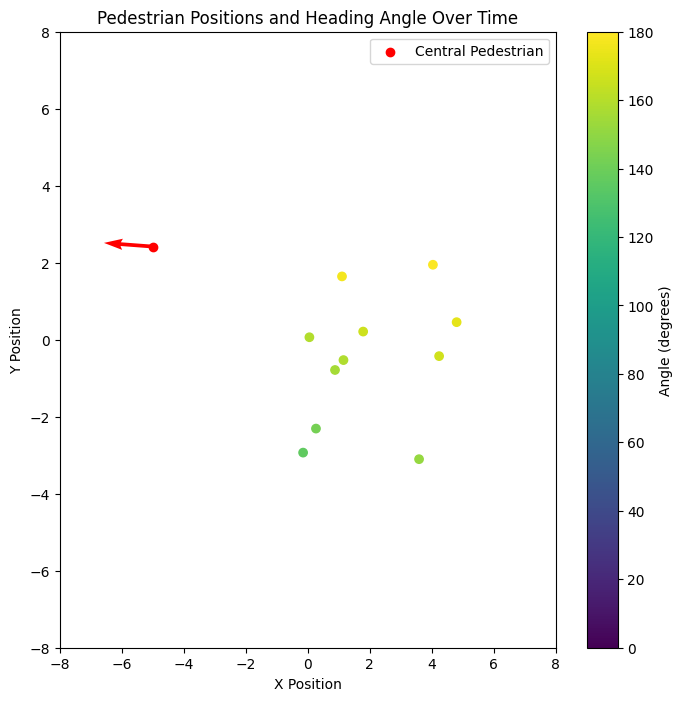

In [110]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib.colors as mcolors

# Assuming 'transformations' and 'root_orient' arrays are predefined and have the proper dimensions.
# 'transformations' should have a shape of [N, T, 2] where N is the number of pedestrians,
# T is the number of timesteps, and 2 represents the X and Y coordinates.
# 'root_orient' should have a similar structure but for orientations.

T = transformations.shape[1]
N = transformations.shape[0]

# Central pedestrian POV index
pov_index =9  # Assuming the first pedestrian is the one we're focusing on

# Setup the figure and axis for animation
fig, ax = plt.subplots(figsize=(8, 8))
cmap = plt.get_cmap('viridis')

# Set axis limits
max_length = 8  # You may want to adjust this based on your data
ax.set_xlim(-max_length, max_length)
ax.set_ylim(-max_length, max_length)

# Prepare scatter plot objects
scatter = ax.scatter([], [], c=[], cmap=cmap, vmin=0, vmax=180)  # Assuming angles vary between 0 and 180 degrees
central_pedestrian = ax.scatter([], [], c='r', label='Central Pedestrian')
quiver = ax.quiver([], [], [], [], color='red', scale=10)

# Colorbar (this will remain static)
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Angle (degrees)')

# Legends and Labels
ax.legend()
ax.set_xlabel('X Position')
ax.set_ylabel('Y Position')
ax.set_title('Pedestrian Positions and Heading Angle Over Time')


# Initialization function: plot the background of each frame
def init():
    scatter.set_offsets(np.empty((0, 2)))
    scatter.set_array(np.empty(0))
    central_pedestrian.set_offsets(np.empty((0, 2)))
    quiver.set_offsets(np.empty((0, 2)))
    return scatter, central_pedestrian, quiver,

# Animation update function: this is called sequentially
def update(frame):
    transCenter = transformations[pov_index, frame, :2]
    otherTrans = transformations[:, frame, :2]
    headingCenter =  (np.arctan2(root_orient[pov_index, frame, 1], root_orient[pov_index, frame, 0]))

    vectors = otherTrans - transCenter
    norms = np.linalg.norm(vectors, axis=1)
    unitVectors = vectors / norms[:, None]  # Add an axis for broadcasting

    angles_rad = np.arccos(np.clip(np.dot(unitVectors, [np.cos(headingCenter), np.sin(headingCenter)]), -1.0, 1.0))
    angles_deg = np.rad2deg(angles_rad)

    scatter.set_offsets(otherTrans)
    scatter.set_array(angles_deg)

    central_pedestrian.set_offsets([transCenter])

    quiver.set_offsets([transCenter])
    quiver.set_UVC(np.cos(headingCenter), np.sin(headingCenter))

    return scatter, central_pedestrian, quiver,

# Create animation using FuncAnimation
ani = FuncAnimation(fig, update, frames=T, init_func=init, blit=True)

# Save the animation
ani.save('pedestrian_positions_and_headings_animation_9.gif', writer='pillow', fps=20)

plt.show()


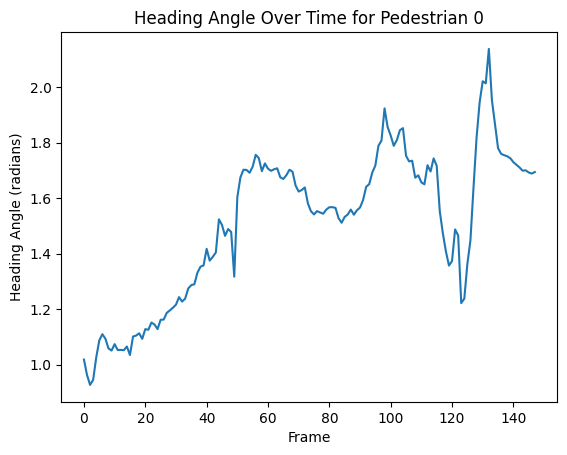

In [63]:
# plot the heading angle over time for the first pedestrian
heading = np.arctan2(root_orient[2, :, 1], root_orient[2, :, 0])



plt.plot(heading)
plt.xlabel('Frame')
plt.ylabel('Heading Angle (radians)')
plt.title('Heading Angle Over Time for Pedestrian 0')
plt.show()

In [17]:
import plotly.graph_objects as go
fig = go.Figure()

for i in range(transformations.shape[0]):
    x = transformations[i, :, 0]
    y = transformations[i, :, 1]
    z = transformations[i, :, 2]
    fig.add_trace(go.Scatter3d(x=x, y=y, z=z, mode='markers', name='markers'))

fig.show()


In [58]:
import plotly.figure_factory as ff
import numpy as np

root_orient = smoothed_data['root_orient']

# Assuming root_orient and transformations are already defined
N, T, _ = root_orient.shape

# Initialize lists to hold quiver data
X, Y, U, V = [], [], [], []

for n in range(N):
    for t in range(T):
        x = transformations[n, t, 0]
        y = transformations[n, t, 1]
        theta_x = np.cos(root_orient[n, t, 0])
        theta_y = np.sin(root_orient[n, t, 1])

        # Append data for each arrow
        # Append every 10th arrow to reduce clutter
        if t % 7 == 0:
            X.append(x)
            Y.append(y)
            U.append(theta_x)
            V.append(theta_y)

# Generate quiver plot
fig = ff.create_quiver(X, Y, U, V, scale=0.35, arrow_scale=0.5, name='Quiver', line=dict(width=1))

# Customize layout
fig.update_layout(title='Quiver Plot with Plotly', xaxis_title='X', yaxis_title='Y')

fig.show()


In [96]:
import numpy as np

def getOccupancy(trans, heading, pedestrians_trans):
    paraFOV = {'range': 8, 'resolution': 1}
    biFOV = {'range': 120, 'resolution': 0.85}
    perFOV = {'range': 200, 'resolution': 0.75}
    max_distance = 15

    # Prepare the observer's position and heading vector
    c_pose = np.array(trans[:2])
    heading_radians = np.radians(heading)
    heading_vector = np.array([np.cos(heading_radians), np.sin(heading_radians)])
    
    O_n = []

    for pedestrian_trans in pedestrians_trans:
        pedestrian_pose = np.array(pedestrian_trans[:2])
        pedestrian_vector = pedestrian_pose - c_pose
        distance = np.linalg.norm(pedestrian_vector)
        
        if distance > max_distance:
            continue  # Skip if the pedestrian is beyond the max observation distance

        # Normalize vectors to compute the angle
        pedestrian_vector_normalized = pedestrian_vector / np.linalg.norm(pedestrian_vector)
        angle = np.arccos(np.clip(np.dot(heading_vector, pedestrian_vector_normalized), -1.0, 1.0))
        angle_degrees = np.degrees(angle)

        # Determine FOV zone and assign resolution
        if angle_degrees <= paraFOV['range'] / 2:
            resolution = paraFOV['resolution']
        elif angle_degrees <= biFOV['range'] / 2:
            resolution = biFOV['resolution']
        elif angle_degrees <= perFOV['range'] / 2:
            resolution = perFOV['resolution']
        else:
            resolution = 0  # The pedestrian is outside the peripheral vision

        # Append position and resolution if within FOV
        if resolution > 0:
            O_n.append([pedestrian_pose[0], pedestrian_pose[1], resolution])

    return O_n

# Example usage:
# trans = [0, 0]  # Observer's position
# heading = 90  # Observer's heading in degrees
# pedestrians_trans = [[5, 0], [-3, 4], [10, 1]]  # Pedestrians' positions
# print(check_in_FOV(trans, heading, pedestrians_trans))


In [61]:
import plotly.graph_objects as go
import numpy as np

# Assuming transformations is a 3D array with dimensions [N, T, 3], where
# N is the number of individuals, T is the number of time points, and 3 is for the x, y, z coordinates.

N, T, _ = transformations.shape

# Initialize a figure
fig = go.Figure()

# Calculate global axis limits to keep them constant
x_min, x_max = np.min(transformations[:, :, 0]), np.max(transformations[:, :, 0])
y_min, y_max = np.min(transformations[:, :, 1]), np.max(transformations[:, :, 1])
z_min, z_max = np.min(transformations[:, :, 2]), np.max(transformations[:, :, 2])

# Create initial traces for each individual (empty here, but necessary for the update in frames)
for n in range(N):
    fig.add_trace(go.Scatter3d(x=[], y=[], z=[], mode='lines+markers', name=f'Individual {n}'))

# Define frames, accumulating positions over time
frames = []
for t in range(T):
    frame_data = []
    for n in range(N):
        # Accumulate the tracks up to the current time point for each individual
        frame_data.append(go.Scatter3d(x=transformations[n, :t+1, 0], y=transformations[n, :t+1, 1], z=transformations[n, :t+1, 2], 
                                       mode='lines+markers', name=f'Individual {n}'))
    frames.append(go.Frame(data=frame_data, name=str(t)))

fig.frames = frames

# Add play and pause button functionality
fig.update_layout(
    updatemenus=[dict(type='buttons',
                      showactive=False,
                      y=0,
                      x=1.05,
                      xanchor='right',
                      yanchor='bottom',
                      buttons=[dict(label='Play',
                                    method='animate',
                                    args=[None, dict(frame=dict(duration=500, redraw=True), 
                                                     fromcurrent=True, mode='immediate')],
                                    ),
                               dict(label='Pause',
                                    method='animate',
                                    args=[[None], dict(frame=dict(duration=0, redraw=False), 
                                                       mode='immediate')],
                                    )])],
    sliders=[dict(steps=[dict(method='animate',
                              args=[[f.name], dict(mode='immediate', frame=dict(duration=500, redraw=True), fromcurrent=True)],
                              label=f.name) for f in fig.frames],
            transition=dict(duration=0),
            x=0,
            y=0,
            currentvalue=dict(font=dict(size=12), prefix='Time: ', visible=True),
            len=1.0)]
)

# Set constant axis limits
fig.update_layout(scene=dict(xaxis=dict(range=[x_min, x_max], autorange=False),
                             yaxis=dict(range=[y_min, y_max], autorange=False),
                             zaxis=dict(range=[z_min, z_max], autorange=False)))

fig.show()


In [75]:
# plot body_pose joints
import plotly.graph_objects as go
import numpy as np
import torch

# Create CPU Device
device = torch.device("cpu")

# Convert SMPL pkl file to be compatible with Python 3
# Script is from https://rebeccabilbro.github.io/convert-py2-pickles-to-py3/
def convert_pkl(old_pkl, new_pkl):
    """
    Convert a Python 2 pickle to Python 3
    """
    import dill
    import pickle

    # Convert Python 2 "ObjectType" to Python 3 object
    dill._dill._reverse_typemap["ObjectType"] = object

    # Open the pickle using latin1 encoding
    with open(old_pkl, "rb") as f:
        loaded = pickle.load(f, encoding="latin1")

    # Re-save as Python 3 pickle
    with open(new_pkl, "wb") as outfile:
        pickle.dump(loaded, outfile)


def load_smpl_body_model(
    path,
    batch_size,
    num_betas=16,
    model_type="smplh",
    use_vtx_selector=True,
    device=None,
):
    """
    Load SMPL model
    """
    if device is None:
        device = torch.device("cpu")
    fit_gender = path.split("/")[-2]
    return (
        BodyModel(
            bm_path=path,
            num_betas=num_betas,
            batch_size=batch_size,
            use_vtx_selector=use_vtx_selector,
            model_type=model_type,
        ).to(device),
        fit_gender,
    )


def load_body_model(batch_size, model_type, gender, device):
    assert model_type in ["smpl", "smplh"]
    if model_type == "smpl":
        num_betas = 10
        ext = "pkl"
        use_vtx_selector = False
    else:
        num_betas = 16
        ext = "npz"
        use_vtx_selector = True

    smpl_path = f"{BASE_DIR}/body_models/{model_type}/{gender}/model.{ext}"
    body_model, fit_gender = load_smpl_body_model(
        smpl_path,
        batch_size,
        num_betas,
        model_type=model_type,
        use_vtx_selector=use_vtx_selector,
        device=device,
    )
    return body_model


body_model = load_body_model(N * T, "smplh", "neutral", device)


In [8]:
transformations.shape[1]

148

In [36]:
human_T = smoothed_data['trans'][0,:,:]
# make the human tuple dim have 1, T, 3
human_T = np.expand_dims(human_T, axis=0)
# convert human_T to torch tensor
human_T = torch.tensor(human_T, dtype=torch.float32, device=device)
human_T.shape

torch.Size([1, 148, 3])

In [35]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

smoothed_data['betas'][0]
# convert betas to tensor
betas = torch.tensor(smoothed_data['betas'][0], dtype=torch.float32).to(device)
betas

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [107]:
import numpy as np
jr = np.load('/Users/omoruyiatekha/Documents/GitHub/pedTrack/joints_results.npz', allow_pickle=True)

In [108]:
b = jr['arr_6']
data_dict = b.item()  # This converts the array to a dictionary.
joints = data_dict['joints']
print(joints.shape)

(1, 148, 73, 3)


In [225]:
import plotly.graph_objects as go
import numpy as np

b = jr['arr_2']

# looking down at beginning for arr_4

data_dict = b.item()  # This converts the array to a dictionary.
joints = data_dict['joints']


def get_GazeAngle(head, leftShoulder, rightShoulder, neck):
    # form a plane with the neck, left shoulder, and the right shoulder
    # get the angle between the head and the plane

    plane = np.cross(neck - leftShoulder, neck - rightShoulder)
    head = head
    gazes = np.arccos(np.dot(plane, head) / (np.linalg.norm(plane) * np.linalg.norm(head)))
    # convert to degrees
    gazes = np.degrees(gazes)
    return gazes

# Define joint indices
joint_indices = {
    "head": 15,
    "lefthand": 20,
    "righthand": 21,
    "spine": 3,
    "spine2": 9,
    "hips": 0,
    "neck": 12,
    "rightShoulder": 14,
    "leftShoulder": 13,
    "leftfoot": 7,
    "rightfoot": 8,
}

fig = go.Figure()

# Plot only the specified joints
for joint_name, idx in joint_indices.items():
    # Accessing the coordinates for the specified joint at frame 0
    x = joints[0, 100, idx, 0]
    y = joints[0, 100, idx, 1]
    z = joints[0, 100, idx, 2]

    # Plotting the joint
    fig.add_trace(go.Scatter3d(x=[x], y=[y], z=[z], mode='markers', name=joint_name))

fig_Head = go.Figure()

for i in range(100):

    head = joints[0, i, 15, :]
    leftShoulder = joints[0, i, 13, :]
    rightShoulder = joints[0, i, 14, :]
    neck = joints[0, i, 12, :]

    # center points at the neck
    head = head - neck
    leftShoulder = leftShoulder - neck
    rightShoulder = rightShoulder - neck
    # plot angle over time

    # if greater than 90, then its facing away from the camera
    # if so subtract 180 from the angle



    angle = get_GazeAngle(head, leftShoulder, rightShoulder, neck)

    if angle > 90:
        angle = 180 - angle
    # set color to blue
    fig_Head.add_trace(go.Scatter(x=[i], y=[angle], mode='markers', name='Gaze Angle', marker=dict(color='blue')))

    # add x and y axis labels
    fig_Head.update_xaxes(title_text='Frame')
    fig_Head.update_yaxes(title_text='Gaze Angle (degrees)')
    fig_Head.update_layout(title='Gaze Angle Over Time')


    
    

fig.show()
fig_Head.show()
